This is new **code**

In [1]:
!pip install gymnasium[all] stable-baselines3==2.2.1 box2d-py mujoco

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.5/374.5 kB 23.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 3.7 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of gymnasium[all] to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 37.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.7/181.7 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 97.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 82.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 64.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 

In [2]:
# Install Gymnasium and MuJoCo (DeepMind version)
!pip install gymnasium[mujoco] stable-baselines3==2.2.1

  Using cached stable_baselines3-2.2.1-py3-none-any.whl.metadata (5.0 kB)
  Using cached gymnasium-0.29.1-py3-none-any.whl.metadata (10 kB)
INFO: pip is looking at multiple versions of gymnasium[mujoco] to determine which version is compatible with other requirements. This could take a while.
  Using cached gymnasium-1.1.0-py3-none-any.whl.metadata (9.4 kB)
  Using cached gymnasium-1.0.0-py3-none-any.whl.metadata (9.5 kB)
  Using cached mujoco-3.3.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (44 kB)
  Using cached glfw-2.9.0-py2.py27.py3.py30.py31.py32.py33.py34.py35.py36.py37.py38.p39.p310.p311.p312.p313-none-manylinux_2_28_x86_64.whl.metadata (5.4 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached

In [3]:
import gymnasium as gym

env = gym.make("Hopper-v4", render_mode=None)
obs, _ = env.reset()

done = False
while not done:
    action = env.action_space.sample()
    obs, reward, terminated, truncated, _ = env.step(action)
    done = terminated or truncated

env.close()


In [4]:
import os
import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

In [5]:
import os
from stable_baselines3.common.monitor import Monitor

log_dir = "./logs/"
os.makedirs(log_dir, exist_ok=True)

# Wrap environment with Monitor
from stable_baselines3.common.env_util import make_vec_env

env = make_vec_env("Hopper-v4", n_envs=1, monitor_dir=log_dir)

# Train PPO model
from stable_baselines3 import PPO

model = PPO("MlpPolicy", env, verbose=1)
model.learn(total_timesteps=100_000)


Using cuda device
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20.7     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    fps             | 596      |
|    iterations      | 1        |
|    time_elapsed    | 3        |
|    total_timesteps | 2048     |
---------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 24.9         |
|    ep_rew_mean          | 24.1         |
| time/                   |              |
|    fps                  | 491          |
|    iterations           | 2            |
|    time_elapsed         | 8            |
|    total_timesteps      | 4096         |
| train/                  |              |
|    approx_kl            | 0.014461085  |
|    clip_fraction        | 0.197        |
|    clip_range           | 0.2          |
|    entropy_loss         | -4.24        |
|    explained_variance   | -0.023578286

In [ ]:
model.save("ppo_Hopper-v4")

In [6]:
# Ensure the models directory exists
os.makedirs("models", exist_ok=True)

# Choose environment (you can change to Humanoid-v4, Ant-v4, etc.)
env_name = "Hopper-v4"

# Create a vectorized environment
env = make_vec_env(env_name, n_envs=1)

# Initialize the PPO model
model = PPO("MlpPolicy", env, verbose=1)

# Train the agent
model.learn(total_timesteps=100_000)

# Save the trained model
model.save(f"models/ppo_{env_name.lower()}")
print(f"Model saved as models/ppo_{env_name.lower()}.zip")


Using cuda device
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.7     |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    fps             | 709      |
|    iterations      | 1        |
|    time_elapsed    | 2        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 26.1        |
|    ep_rew_mean          | 27.1        |
| time/                   |             |
|    fps                  | 569         |
|    iterations           | 2           |
|    time_elapsed         | 7           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.016668756 |
|    clip_fraction        | 0.199       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.22       |
|    explained_variance   | 0.010456741 |
|    learnin

In [7]:

# Load environment
eval_env = gym.make(env_name)

# Load the saved PPO model
model = PPO.load(f"models/ppo_{env_name.lower()}")

# Evaluate the trained agent
episodes = 5
for ep in range(episodes):
    obs, _ = eval_env.reset()
    done = False
    total_reward = 0
    while not done:
        action, _states = model.predict(obs)
        obs, reward, terminated, truncated, _ = eval_env.step(action)
        total_reward += reward
        done = terminated or truncated
    print(f"Episode {ep + 1}: Reward = {total_reward}")


Episode 1: Reward = 333.63343898294727
Episode 2: Reward = 700.5933883854699
Episode 3: Reward = 898.9889877506043
Episode 4: Reward = 666.8270356404163
Episode 5: Reward = 628.0962991962928


In [8]:
# Install xvfb and dependencies
!apt-get install -y xvfb libgl1-mesa-glx
!pip install pyvirtualdisplay

# Start virtual display
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.14).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [9]:
import gymnasium as gym
from PIL import Image
import numpy as np

# Make the environment with render_mode
eval_env = gym.make("Hopper-v4", render_mode="rgb_array")
obs, _ = eval_env.reset()
done = False
frames = []

while not done:
    frame = eval_env.render()  # No mode argument needed
    frames.append(Image.fromarray(frame))  # Collect frame
    action = eval_env.action_space.sample()
    obs, reward, terminated, truncated, _ = eval_env.step(action)
    done = terminated or truncated

eval_env.close()

# Save as GIF
frames[0].save("hopper_run.gif", save_all=True, append_images=frames[1:], duration=50, loop=0)


In [10]:
import matplotlib.pyplot as plt
from IPython import display
from PIL import Image
import numpy as np
import gymnasium as gym

# Set render_mode during environment creation
eval_env = gym.make("Hopper-v4", render_mode="rgb_array")

frames = []
obs, _ = eval_env.reset()
done = False

while not done:
    frame = eval_env.render()  # No mode='rgb_array' here
    frames.append(Image.fromarray(frame))
    action, _ = model.predict(obs)
    obs, reward, terminated, truncated, _ = eval_env.step(action)
    done = terminated or truncated

eval_env.close()

# Display one of the frames
frames[0].show()


In [11]:
from stable_baselines3.common.monitor import Monitor
env = Monitor(env)


In [12]:
from stable_baselines3.common.evaluation import evaluate_policy

# Evaluate the PPO model on 10 episodes
mean_reward, std_reward = evaluate_policy(model, eval_env, n_eval_episodes=10, render=False)
print(f"PPO Agent - Mean Reward: {mean_reward}, Std Dev: {std_reward}")


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/evaluation.py:67: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


PPO Agent - Mean Reward: 990.5083682894707, Std Dev: 2.983207434253474


In [13]:
random_rewards = []
for _ in range(10):
    obs, _ = eval_env.reset()
    done = False
    total_reward = 0
    while not done:
        action = eval_env.action_space.sample()
        obs, reward, terminated, truncated, _ = eval_env.step(action)
        total_reward += reward
        done = terminated or truncated
    random_rewards.append(total_reward)

print(f"Random Agent - Mean Reward: {np.mean(random_rewards)}, Std Dev: {np.std(random_rewards)}")


Random Agent - Mean Reward: 14.78897937575087, Std Dev: 9.88503333911127


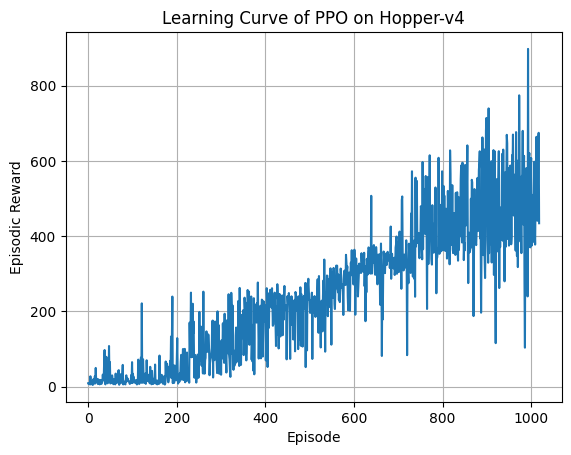

In [14]:
from stable_baselines3.common.results_plotter import load_results
import matplotlib.pyplot as plt

results = load_results(log_dir)

# Plot reward vs. episode number
plt.plot(results['r'])
plt.xlabel("Episode")
plt.ylabel("Episodic Reward")
plt.title("Learning Curve of PPO on Hopper-v4")
plt.grid(True)
plt.show()


In [16]:
import os
os.listdir("models")

['ppo_hopper-v4.zip']

In [17]:
print(env_name)  # should be 'Hopper-v4'
print(f"models/ppo_{env_name.lower()}.zip")  # This should match the path you load from


Hopper-v4
models/ppo_hopper-v4.zip


Save video as GIF

In [18]:
gif_path = "ppo_hopper.gif"
frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=30,
    loop=0,
)
print(f"Saved agent movement as {gif_path}")

Saved agent movement as ppo_hopper.gif


Display video in Colab

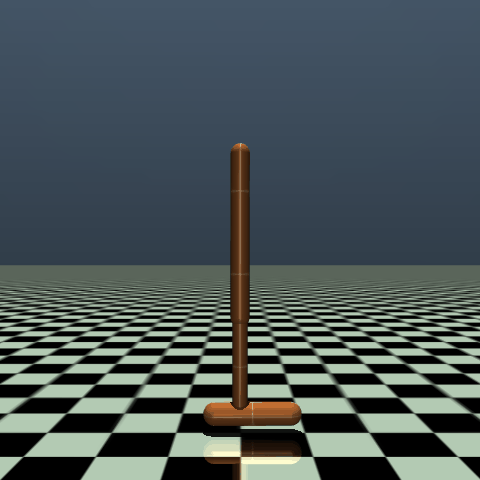

In [19]:
from IPython.display import Image as IPyImage, display as ipydisplay
ipydisplay(IPyImage(filename=gif_path))